<a href="https://colab.research.google.com/github/maxrinal/nlp-disaster/blob/master/DiCaro_97582.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Análisis Exploratorio**

Set de datos, competencia de Kaggle. Tweet relacionados con catástrofes.

### **Importo librerías**

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import nltk
import html
import re

from google.colab import drive
#drive.mount('/content/drive')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### **Opciones de visualización**

In [0]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

plt.style.use('default') #Haciendo los gráficos más bonitos en matplotlib

sns.set(style = 'whitegrid') #Seteando tipo de grid en sns

pd.options.display.float_format = '{:20,.2f}'.format #Suprimimos la notacion científica en los outputs

### **Defino constantes**

In [0]:
ARCHIVO_TRAIN = '/content/drive/My Drive/OrgaDeDatos/Colab Notebooks/train.csv'
LATING_ENCODING = 'latin-1'
UTF_ENCODING = 'utf-8'

### **Importo dataset train de kaggle**

En esta sección analizo su estructura

In [0]:
train = pd.read_csv('https://raw.githubusercontent.com/maxrinal/nlp-disaster/master/train.csv')
train.head()

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1


In [0]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7613 entries, 0 to 7612
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        7613 non-null   int64 
 1   keyword   7552 non-null   object
 2   location  5080 non-null   object
 3   text      7613 non-null   object
 4   target    7613 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 297.5+ KB


In [0]:
train.keyword.describe()

count           7552
unique           221
top       fatalities
freq              45
Name: keyword, dtype: object

In [0]:
train['keyword'].value_counts().head()

fatalities     45
deluge         42
armageddon     42
body%20bags    41
harm           41
Name: keyword, dtype: int64

In [0]:
train.location.describe()

count     5080
unique    3341
top        USA
freq       104
Name: location, dtype: object

In [0]:
train['location'].value_counts().head()

USA              104
New York          71
United States     50
London            45
Canada            29
Name: location, dtype: int64

In [0]:
train['target'] = train['target'].astype(bool)
train.target.value_counts()

False    4342
True     3271
Name: target, dtype: int64

### **Analizo el porcentaje de verdaderos en "keyword" y "location"**

In [0]:
grouped_by_keyword_target = train.groupby(['keyword']).agg({'target' : ['mean', 'count']}) #Al ser target booleana, el mean coincide con el procentage
grouped_by_keyword_target = grouped_by_keyword_target.sort_values(('target', 'mean'), ascending = False)
level0 = grouped_by_keyword_target.columns.get_level_values(0)
level1 = grouped_by_keyword_target.columns.get_level_values(1)
grouped_by_keyword_target.columns = level0 + '_' + level1
grouped_by_keyword_target = grouped_by_keyword_target.reset_index()
grouped_by_keyword_target = grouped_by_keyword_target.rename(columns = {'target_mean' : 'target_coverage_true'})
grouped_by_keyword_target.head()

,keyword,target_coverage_true,target_count
0,debris,1.00,37
1,wreckage,1.00,39
2,derailment,1.00,39
3,outbreak,0.97,40
4,oil%20spill,0.97,38


In [0]:
grouped_by_keyword_target.sort_values('target_coverage_true', ascending = True).head()

,keyword,target_coverage_true,target_count,true_count
220,aftershock,0.00,34,0.00
219,body%20bags,0.02,41,1.00
218,ruin,0.03,37,1.00
217,blazing,0.03,34,1.00
216,body%20bag,0.03,33,1.00


In [0]:
grouped_by_location = train.groupby(['location']).agg({'target' : ['mean', 'count']}) #Al ser target booleana, el mean coincide con el procentage
grouped_by_location = grouped_by_location.sort_values(('target', 'count'), ascending = False)
level0 = grouped_by_location.columns.get_level_values(0)
level1 = grouped_by_location.columns.get_level_values(1)
grouped_by_location.columns = level0 + '_' + level1
grouped_by_location = grouped_by_location.reset_index()
grouped_by_location = grouped_by_location.rename(columns = {'target_mean' : 'target_coverage_true'})
grouped_by_location.head()

,location,target_coverage_true,target_count
0,USA,0.64,104
1,New York,0.23,71
2,United States,0.54,50
3,London,0.36,45
4,Canada,0.45,29


### **Analizo target y la longitud del tweet**

En el campo text venían links a las fuentes de los tweets. En la instrucción siguiente los elimino y luego calculo la longitud de cada tweet.

In [0]:
train['text'] = train.text.transform(lambda x: re.sub(r'\w+:\/{2}[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', '', str(x)))
train['length_text'] = train.text.transform(lambda x: len(x))

In [0]:
train['length_text'].describe()

count               7,552.00
mean                   87.51
std                    32.49
min                     6.00
25%                    63.00
50%                    90.00
75%                   114.00
max                   157.00
Name: length_text, dtype: float64

In [0]:
train['target'] = train['target'].astype(int)
train.head()

,id,keyword,location,text,target,length_text
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1,69
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1,38
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1,133
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1,65
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1,88


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


Text(0, 0.5, 'True = 1 / False = 0')

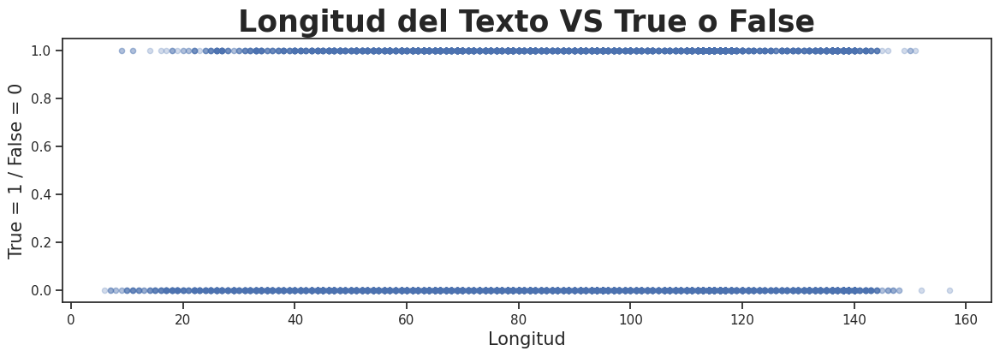

In [0]:
train.plot.scatter('length_text', 'target', alpha = 0.25, figsize = (14, 4));
plt.title('Longitud del Texto VS True o False', fontsize = 25, fontweight = 'bold')
ax = plt.gca()
ax.set_xlabel('Longitud', fontsize = 15)
ax.set_ylabel('True = 1 / False = 0', fontsize = 15)

Text(0, 0.5, 'Frecuencia')

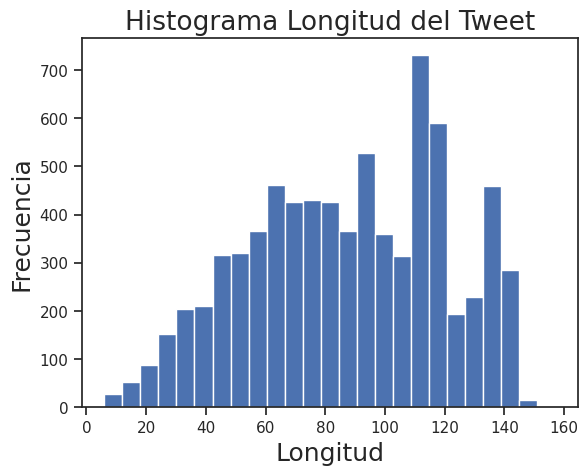

In [0]:
g = train['length_text'].plot.hist(bins = 25)
g.set_title('Histograma Longitud del Tweet', fontsize = 19)
g.set_xlabel('Longitud', fontsize = 18)
g.set_ylabel('Frecuencia', fontsize = 18)

Text(0, 0.5, 'Densidad')

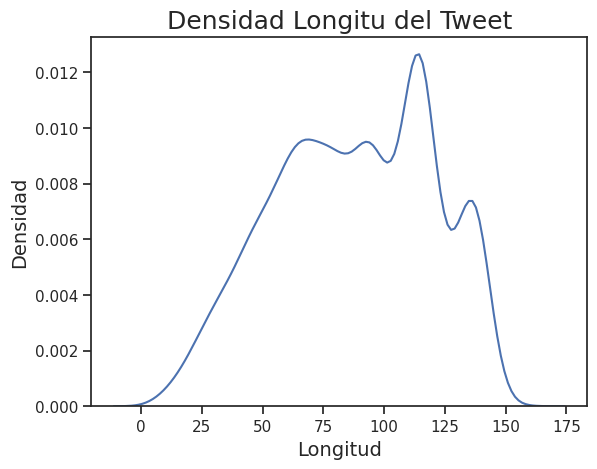

In [0]:
g = sns.distplot(train['length_text'], hist = False)
g.set_title('Densidad Longitu del Tweet', fontsize = 18)
g.set_xlabel('Longitud', fontsize = 14)
g.set_ylabel('Densidad', fontsize = 14)

Text(0.5, 0, 'Densidad')

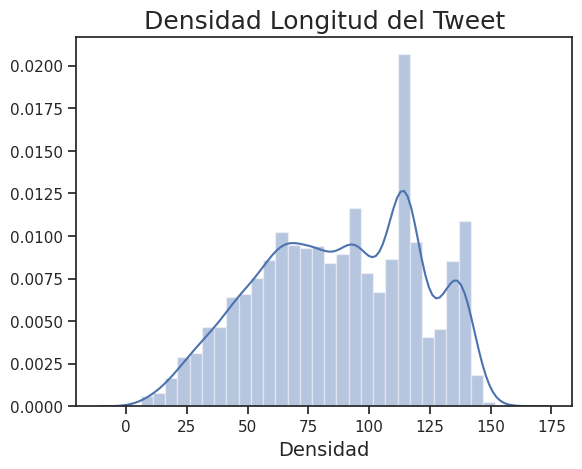

In [0]:
g = sns.distplot(train['length_text'], hist = True)
g.set_title('Densidad Longitud del Tweet', fontsize = 18)
g.set_xlabel('Longitud', fontsize = 15)
g.set_xlabel('Densidad', fontsize = 14)

Text(0, 0.5, 'Densidad')

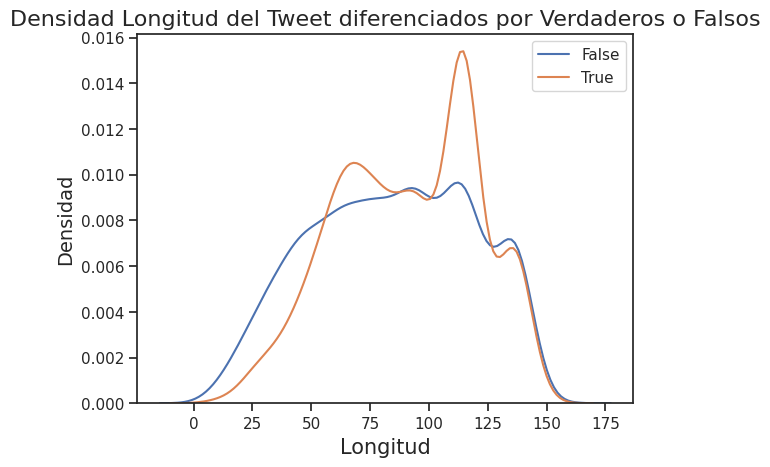

In [0]:
g = sns.distplot(train.loc[train['target'] == 0, 'length_text'], hist = False, label = 'False')
g = sns.distplot(train.loc[train['target'] == 1, 'length_text'], hist = False, label = 'True')
g.set_title('Densidad Longitud del Tweet diferenciados por Verdaderos o Falsos', fontsize = 16)
g.set_xlabel('Longitud', fontsize = 15)
g.set_ylabel('Densidad', fontsize = 14)

Text(0.5, 1.0, 'Distribución de la Longitud')

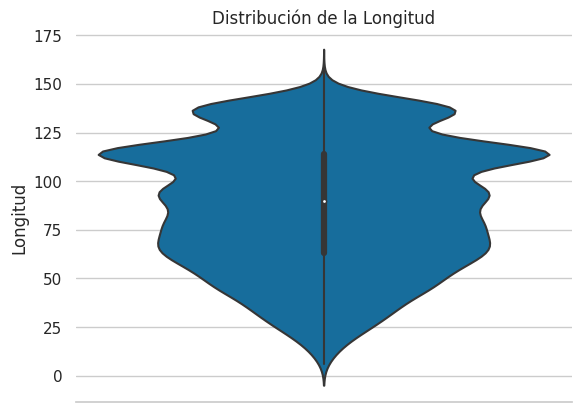

In [0]:
sns.set(style="whitegrid", palette = "colorblind", color_codes=True)

g = sns.violinplot(y = 'length_text', data = train)
sns.despine(left=True)
g.set_ylabel('Longitud')
g.set_title('Distribución de la Longitud')

Text(0.5, 1.0, 'Boxplot Longitud del Texto')

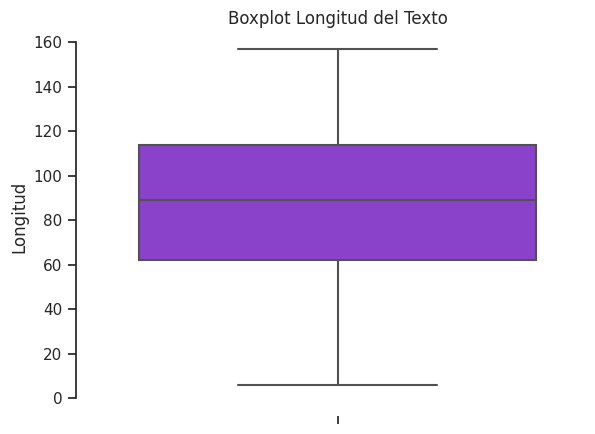

In [0]:
sns.set(style = "ticks", palette = "bright")

g = sns.boxplot(y = "length_text", palette=["m"], data = train)
sns.despine(offset=10, trim=True)
g.set_ylabel('Longitud')
g.set_title('Boxplot Longitud del Texto')

### **Análisis del campo keyword**

En algunas keyword los espacios están rempresentados por "%20" (html encoding). En la siguiente instrucción los reemplazo por espacios en blanco.

In [0]:
train['keyword'] = train.loc[:, 'keyword'].str.replace('%20', ' ')

'oil spill'

In [0]:
train.describe()

,id,target,length_text,length_text_mean_by_keyword,length_text_std_by_keyword,keyword_counts,quantity_words
count,"7,552.00","7,552.00","7,552.00","7,552.00","7,552.00","7,552.00","7,552.00"
mean,"5,442.68",0.43,87.51,87.51,30.69,34.84,14.31
std,"3,111.92",0.49,32.49,10.87,4.90,3.86,5.84
min,48.00,0.00,6.00,56.05,15.99,9.00,1.00
25%,"2,759.75",0.00,63.00,80.76,27.86,33.00,10.00
50%,"5,408.50",0.00,90.00,88.18,31.07,35.00,14.00
75%,"8,126.50",1.00,114.00,95.00,34.25,37.00,18.00
max,"10,834.00",1.00,157.00,119.09,42.36,45.00,31.00


In [0]:
grouped_by_keyword_target['true_count'] = grouped_by_keyword_target.loc[:, 'target_count'] * grouped_by_keyword_target.loc[:, 'target_coverage_true']
grouped_by_keyword_target = grouped_by_keyword_target.sort_values('target_count', ascending = False)
grouped_by_keyword_target.describe()

,target_coverage_true,target_count,true_count
count,221.00,221.00,221.00
mean,0.42,34.17,14.61
std,0.27,4.79,9.70
min,0.00,9.00,0.00
25%,0.18,33.00,6.00
50%,0.38,35.00,13.00
75%,0.67,37.00,22.00
max,1.00,45.00,39.00


In [0]:
grouped_by_keyword_target.sort_values('target_coverage_true').head()

,keyword,target_coverage_true,target_count,true_count
220,aftershock,0.00,34,0.00
219,body%20bags,0.02,41,1.00
218,ruin,0.03,37,1.00
217,blazing,0.03,34,1.00
216,body%20bag,0.03,33,1.00


Text(0, 0.5, 'Porcentaje de Verdaderos')

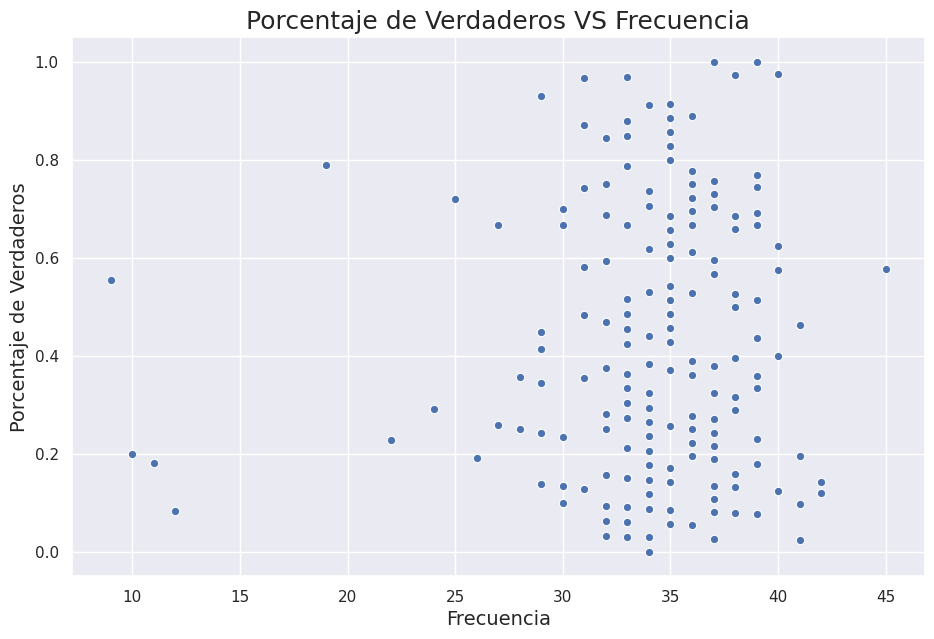

In [0]:
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'target_count', y = 'target_coverage_true', data = grouped_by_keyword_target)

ax.set_title('Porcentaje de Verdaderos VS Frecuencia', fontsize = 18)
ax.set_xlabel('Frecuencia', fontsize = 14)
ax.set_ylabel('Porcentaje de Verdaderos', fontsize = 14)

Text(0.5, 1.0, 'Boxplot Apariciones Keyword')

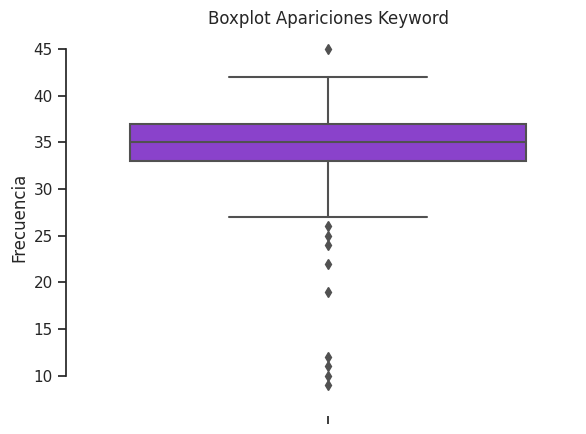

In [0]:
sns.set(style = "ticks", palette = 'bright')

g = sns.boxplot(y = "target_count", palette=["m"], data = grouped_by_keyword_target)
sns.despine(offset=10, trim=True)
g.set_ylabel('Frecuencia')
g.set_title('Boxplot Apariciones Keyword')

In [0]:
train.keyword.value_counts().head()

fatalities    45
armageddon    42
deluge        42
body bags     41
damage        41
Name: keyword, dtype: int64

Text(0, 0.5, 'Fecuencia')

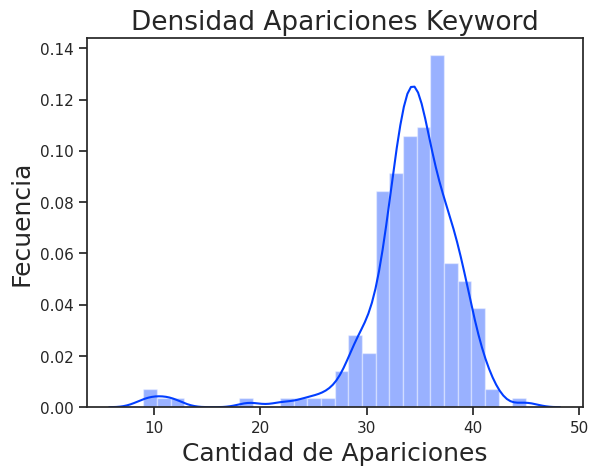

In [0]:
g = sns.distplot(train.keyword.value_counts(), hist = True)
g.set_title('Densidad Apariciones Keyword', fontsize = 19)
g.set_xlabel('Cantidad de Apariciones', fontsize = 18)
g.set_ylabel('Fecuencia', fontsize = 18)

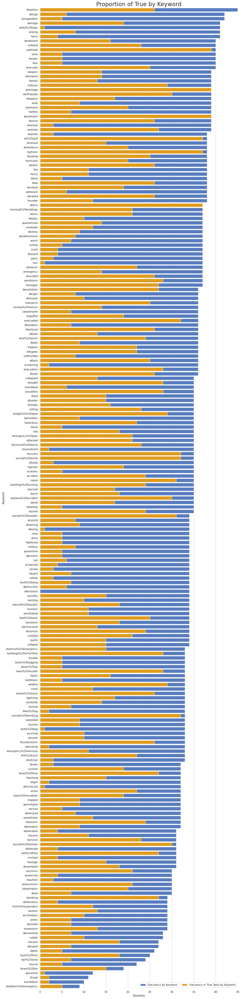

In [0]:
sns.set(style = 'whitegrid')
f, ax = plt.subplots(figsize = (15, 75))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target,\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target, label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 24)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45), ylabel = 'Keyword', xlabel = 'Quantity')

sns.despine(left = True, bottom = True)


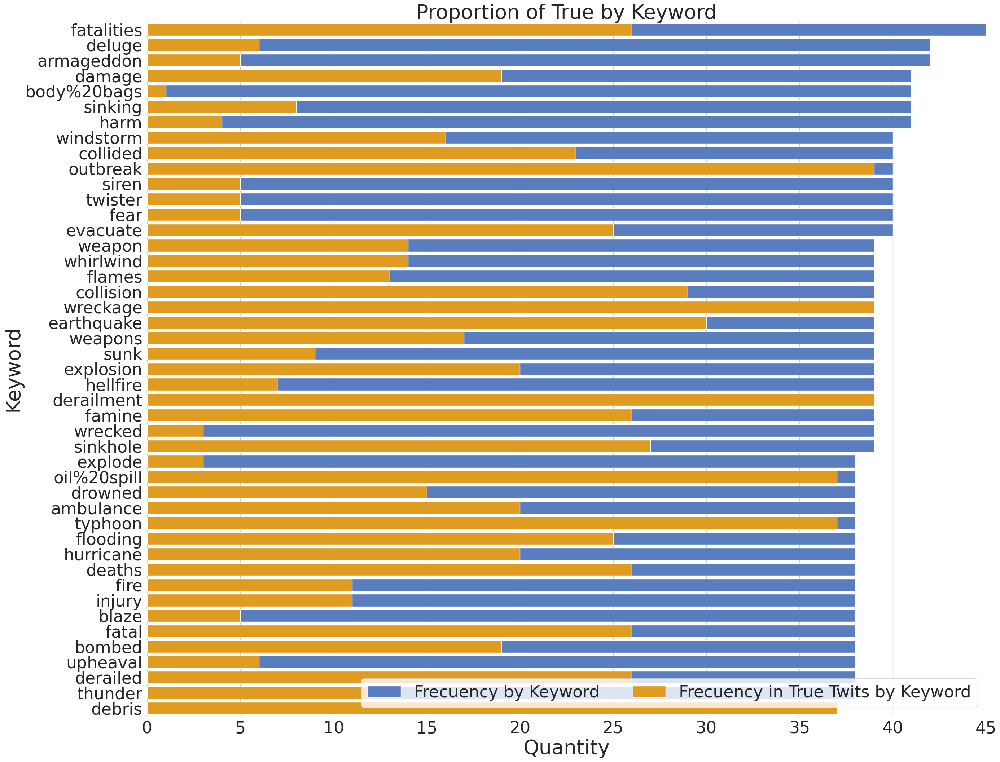

In [0]:
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[0:45, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[0:45, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

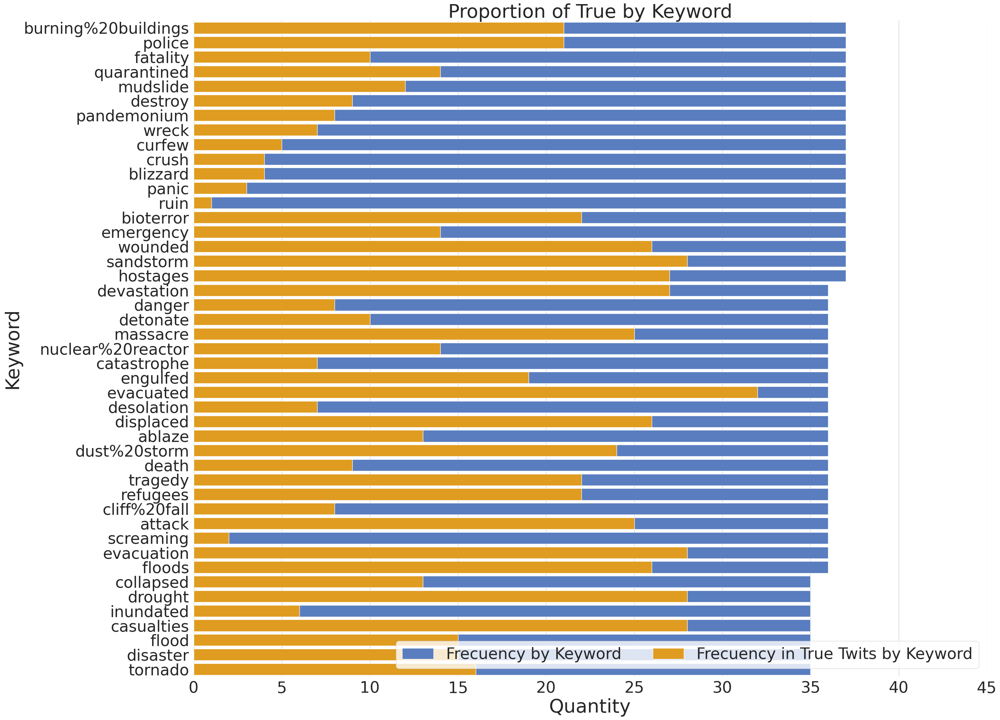

In [0]:
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[45:90, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[45:90, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

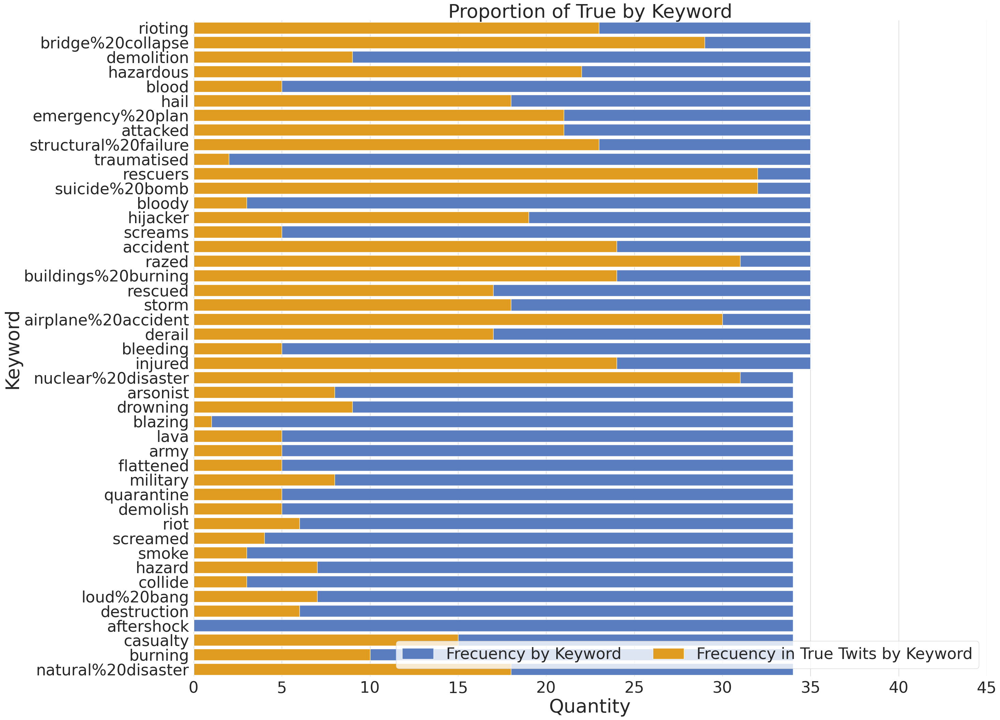

In [0]:
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[90:135, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[90:135, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

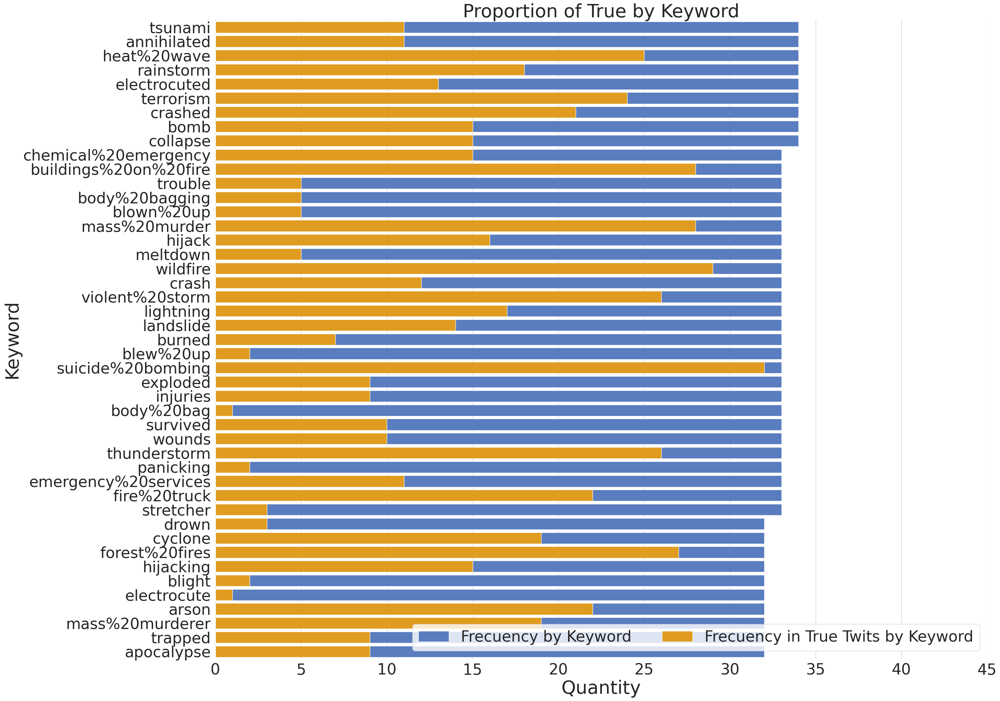

In [0]:
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[135:180, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[135:180, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

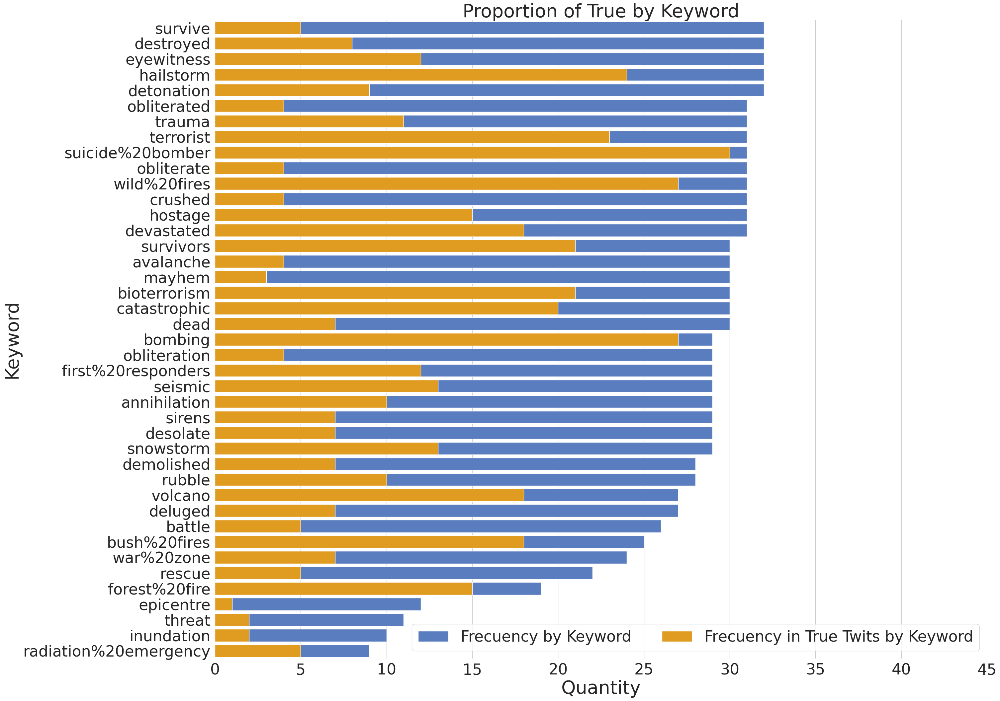

In [0]:
sns.set(style = 'whitegrid', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 25))

sns.set_color_codes('muted')
sns.barplot(x = 'target_count', y = 'keyword', data = grouped_by_keyword_target.iloc[180:, :],\
            label = 'Frecuency by Keyword', color = 'b')

sns.set_color_codes('pastel')
sns.barplot(x = 'true_count', y = 'keyword',\
            data = grouped_by_keyword_target.iloc[180:, :], label = 'Frecuency in True Twits by Keyword',\
            color = 'orange') 

ax.set_title('Proportion of True by Keyword', fontsize = 40)
ax.legend(ncol = 2, loc = 'lower right', frameon = True)
ax.set(xlim = (0, 45))
ax.set_ylabel('Keyword', fontsize = 40)
ax.set_xlabel('Quantity', fontsize = 40)

sns.despine(left = True, bottom = True)

In [0]:
grouped_by_keyword_length = train.groupby(['keyword']).agg({'length_text' : ['mean', 'std', 'count']})
grouped_by_keyword_length = grouped_by_keyword_length.sort_values(('length_text', 'count'), ascending = False)
level0 = grouped_by_keyword_length.columns.get_level_values(0)
level1 = grouped_by_keyword_length.columns.get_level_values(1)
grouped_by_keyword_length.columns = level0 + '_' + level1
grouped_by_keyword_length = grouped_by_keyword_length.reset_index()
grouped_by_keyword_length.head()

,keyword,length_text_mean,length_text_std,length_text_count
0,fatalities,90.89,29.79,45
1,deluge,100.57,30.46,42
2,armageddon,91.40,31.94,42
3,sinking,94.07,32.25,41
4,damage,86.15,35.19,41


In [0]:
train = train.merge(grouped_by_keyword_length)
train = train.rename(columns = {'length_text_mean' : 'length_text_mean_by_keyword', 'length_text_std' : 'length_text_std_by_keyword', 'length_text_count' : 'length_text_count_by_keyword'})

In [0]:
train = train.rename(columns = {'length_text_count_by_keyword' : 'keyword_counts'})

In [0]:
train = train.sort_values(['keyword_counts', 'keyword'], ascending = False)

In [0]:
train['target_categorico'] = train.target.astype(bool)

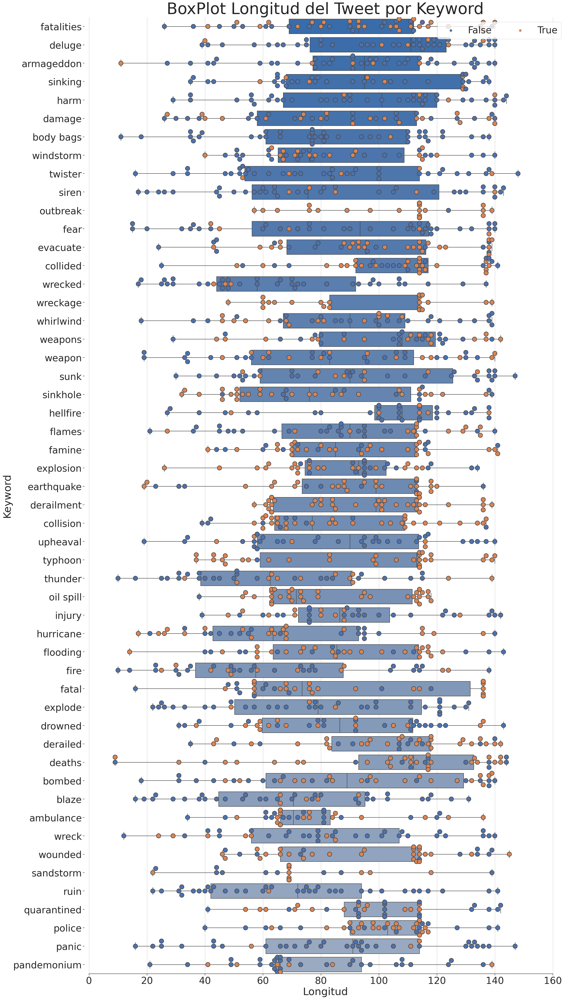

In [0]:
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[:2023, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

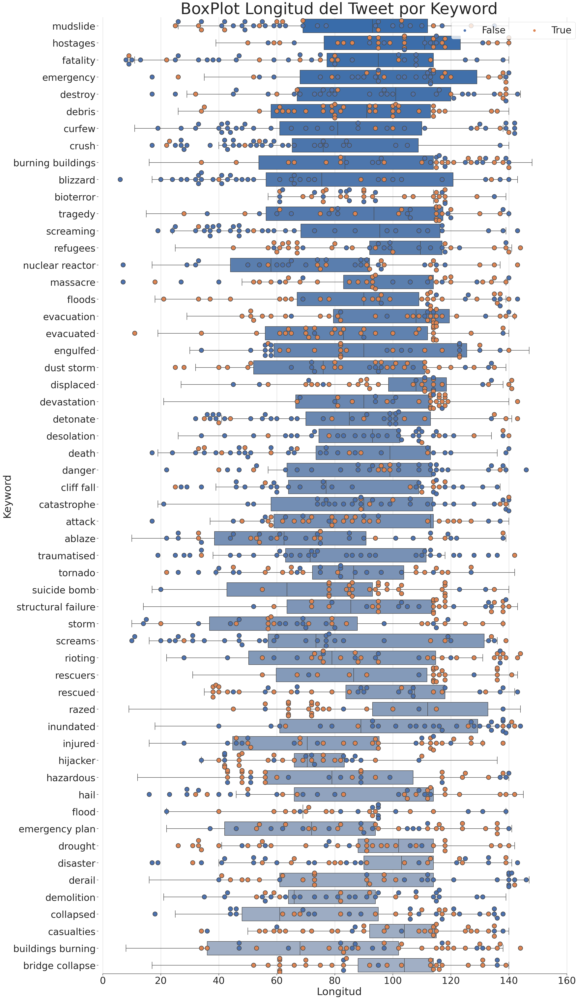

In [0]:
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[2023:4025, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

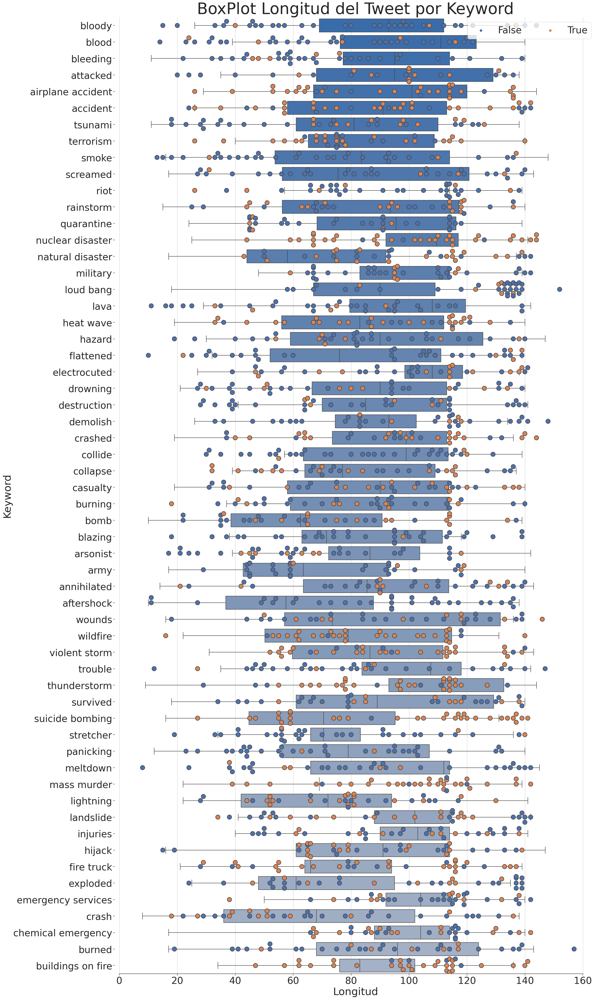

In [0]:
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[4025:5981, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

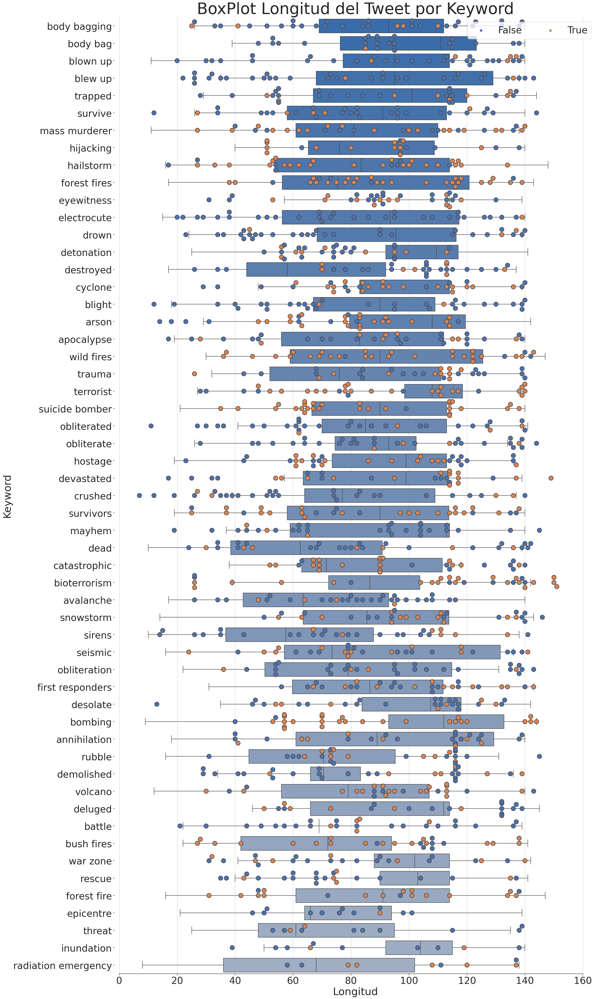

In [0]:
sns.set(style = 'ticks', font_scale = 3)
f, ax = plt.subplots(figsize = (30, 60))

sns.set_color_codes('pastel')
sns.boxplot(x = 'length_text', y = 'keyword', data = train, whis = [0, 100], palette = 'vlag')

sns.set_color_codes('bright')
sns.swarmplot(x = 'length_text', y = 'keyword', hue = 'target_categorico', data = train.iloc[5981:, :], size = 15, linewidth = 2)

ax.set_title('BoxPlot Longitud del Tweet por Keyword', fontsize = 55)
ax.xaxis.grid(True)
ax.set(ylabel = 'Keyword', xlabel = 'Longitud')
ax.legend(ncol = 2, loc = 'upper right', frameon = True)
sns.despine(trim = True, left = True)

In [0]:
grouped_by_keyword = grouped_by_keyword_length.merge(grouped_by_keyword_target, left_on = 'keyword', right_on = 'keyword', how = 'outer')
grouped_by_keyword.drop(columns = 'target_count', inplace = True)
grouped_by_keyword.head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count
0,fatalities,90.89,29.79,45.00,0.58,26.00
1,deluge,100.57,30.46,42.00,0.14,6.00
2,armageddon,91.40,31.94,42.00,0.12,5.00
3,sinking,94.07,32.25,41.00,0.20,8.00
4,damage,86.15,35.19,41.00,0.46,19.00


In [0]:
grouped_by_keyword_target_length_mean_true = train.loc[train.loc[:, 'target'] == True].groupby(['keyword']).agg({'length_text' : 'mean'})
grouped_by_keyword_target_length_mean_true = grouped_by_keyword_target_length_mean_true.reset_index()
grouped_by_keyword_target_length_mean_true = grouped_by_keyword_target_length_mean_true.rename(columns = {'length_text' : 'length_text_mean_true'})
grouped_by_keyword_target_length_mean_true.head()

,keyword,length_text_mean_true
0,ablaze,74.62
1,accident,87.29
2,airplane accident,93.63
3,ambulance,78.70
4,annihilated,92.00


In [0]:
grouped_by_keyword_target_length_mean_false = train.loc[train.loc[:, 'target'] == False].groupby(['keyword']).agg({'length_text' : 'mean'})
grouped_by_keyword_target_length_mean_false = grouped_by_keyword_target_length_mean_false.reset_index()
grouped_by_keyword_target_length_mean_false = grouped_by_keyword_target_length_mean_false.rename(columns = {'length_text' : 'length_text_mean_false'})
grouped_by_keyword_target_length_mean_false.head()

,keyword,length_text_mean_false
0,ablaze,75.30
1,accident,93.45
2,aftershock,87.53
3,airplane accident,89.80
4,ambulance,76.39


In [0]:
grouped_by_keyword_target_length_mean = grouped_by_keyword_target_length_mean_true.merge(grouped_by_keyword_target_length_mean_false, left_on = 'keyword', right_on = 'keyword', how = 'outer')
grouped_by_keyword_target_length_mean = grouped_by_keyword_target_length_mean.merge(grouped_by_keyword)

In [0]:
grouped_by_keyword_length_std_true = train.loc[train.loc[:, 'target_categorico'] == True, :].groupby(['keyword']).agg({'length_text' : 'std'})

In [0]:
grouped_by_keyword_length_std_true.tail()

,length_text
keyword,
wounded,27.91
wounds,32.72
wreck,23.93
wreckage,23.17
wrecked,3.06


In [0]:
grouped_by_keyword_target_length_mean.loc[grouped_by_keyword_target_length_mean['length_text_mean_true'] >\
                                          grouped_by_keyword_target_length_mean['length_text_mean_false'], :].tail(5)

,keyword,length_text_mean_true,length_text_mean_false,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count
207,volcano,93.50,91.11,92.70,27.86,27.00,0.67,18.00
208,war zone,80.86,77.88,78.75,32.40,24.00,nan,nan
209,weapon,92.71,79.04,83.95,35.33,39.00,0.36,14.00
210,weapons,101.65,98.82,100.05,28.95,39.00,0.44,17.00
216,wounds,98.00,92.26,94.00,33.51,33.00,0.30,10.00


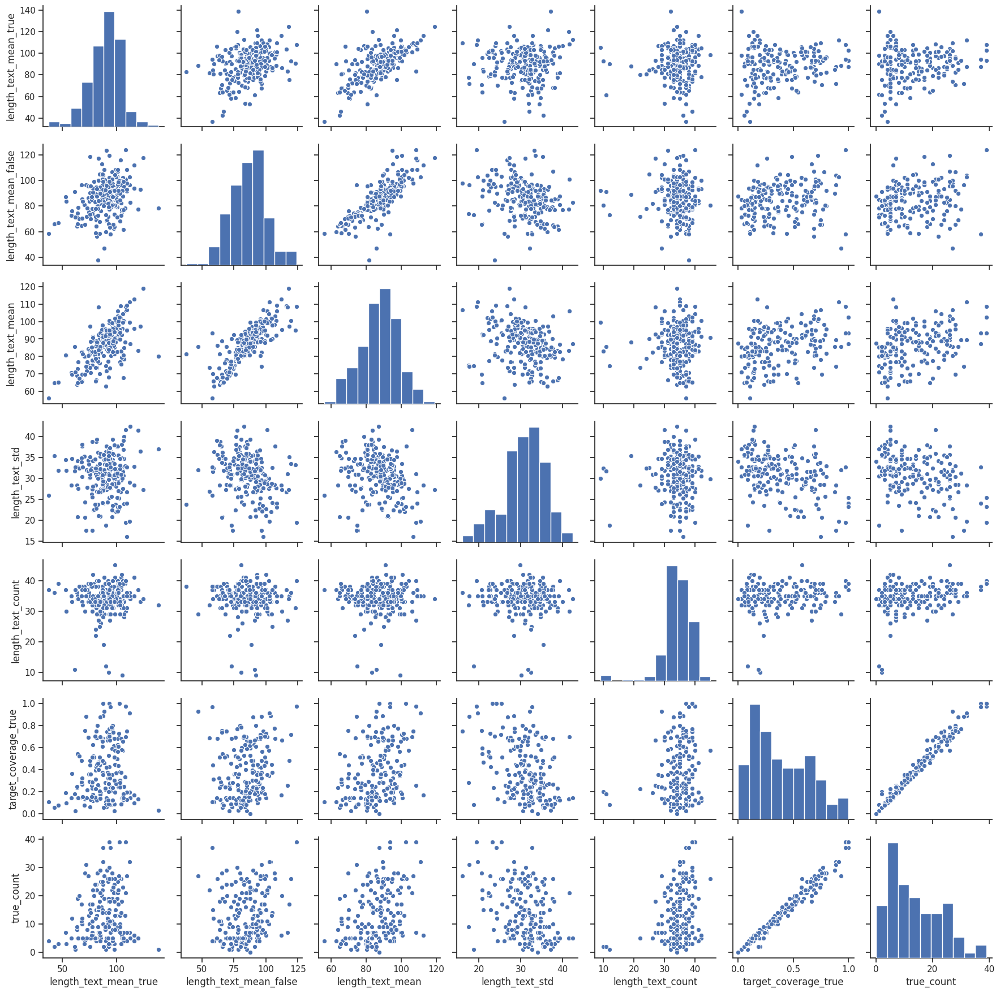

In [0]:
sns.set(style="ticks")

sns.pairplot(grouped_by_keyword_target_length_mean)

Text(0, 0.5, 'Longitud Media Total por Keyword')

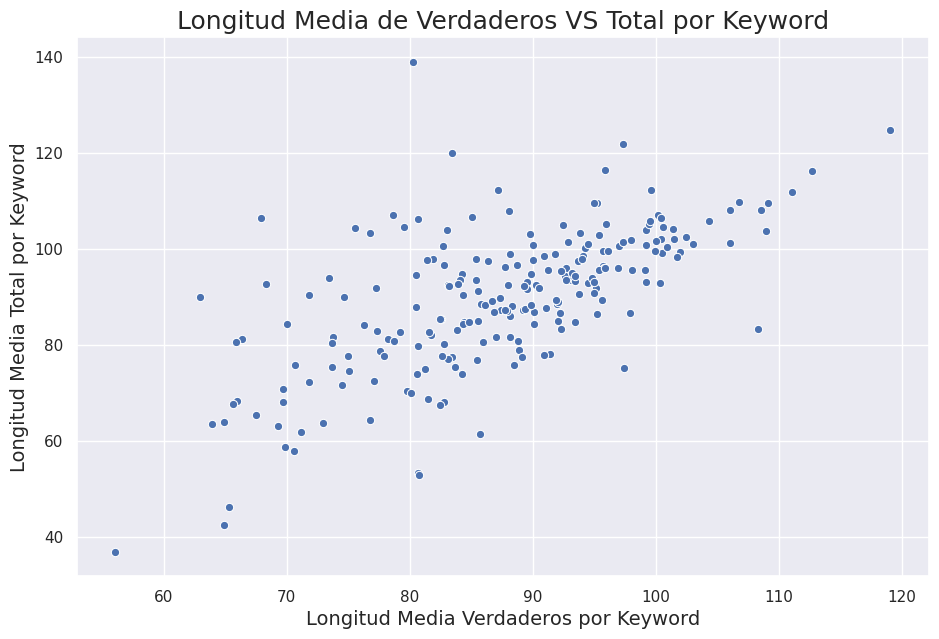

In [0]:
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text_mean', y = 'length_text_mean_true', data = grouped_by_keyword_target_length_mean)

ax.set_title('Longitud Media de Verdaderos VS Total por Keyword', fontsize = 18)
ax.set_xlabel('Longitud Media Verdaderos por Keyword', fontsize = 14)
ax.set_ylabel('Longitud Media Total por Keyword', fontsize = 14)

Text(0.5, 1.0, 'Longitud Media por Keyword')

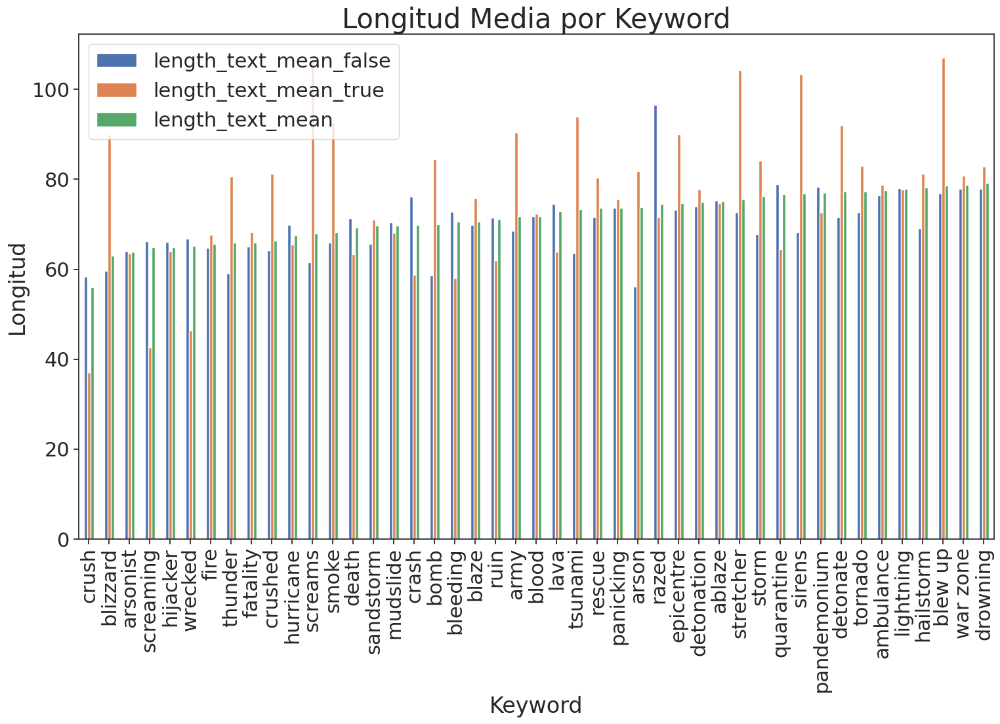

In [0]:
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[:45, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0.5, 1.0, 'Longitud Media por Keyword')

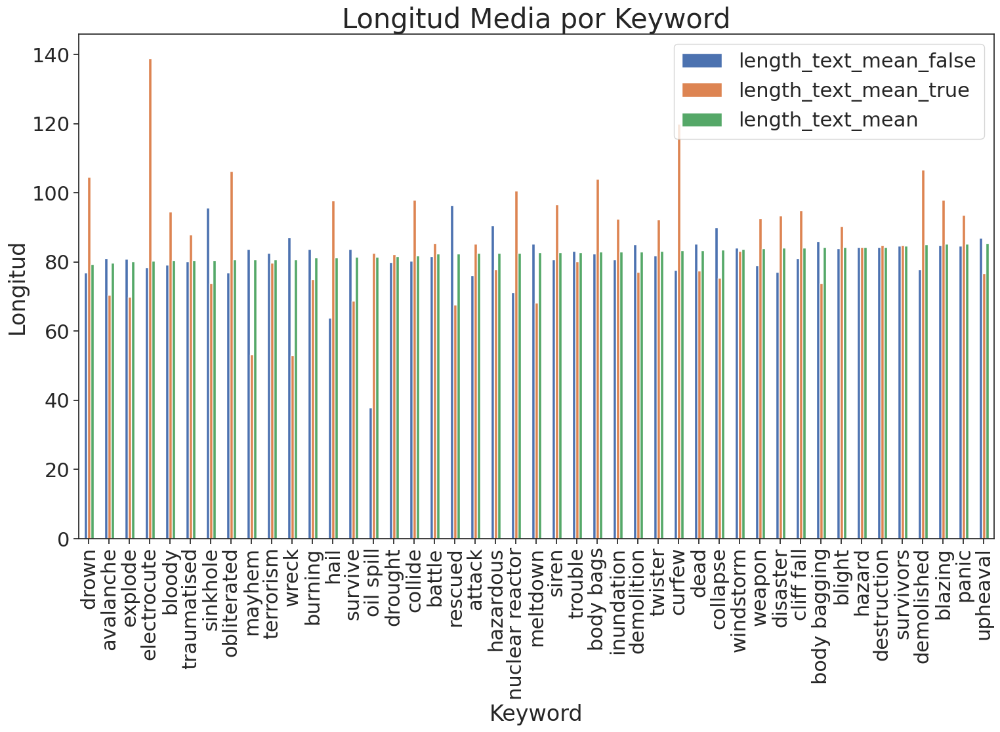

In [0]:
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[45:90, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0.5, 1.0, 'Longitud Media por Keyword')

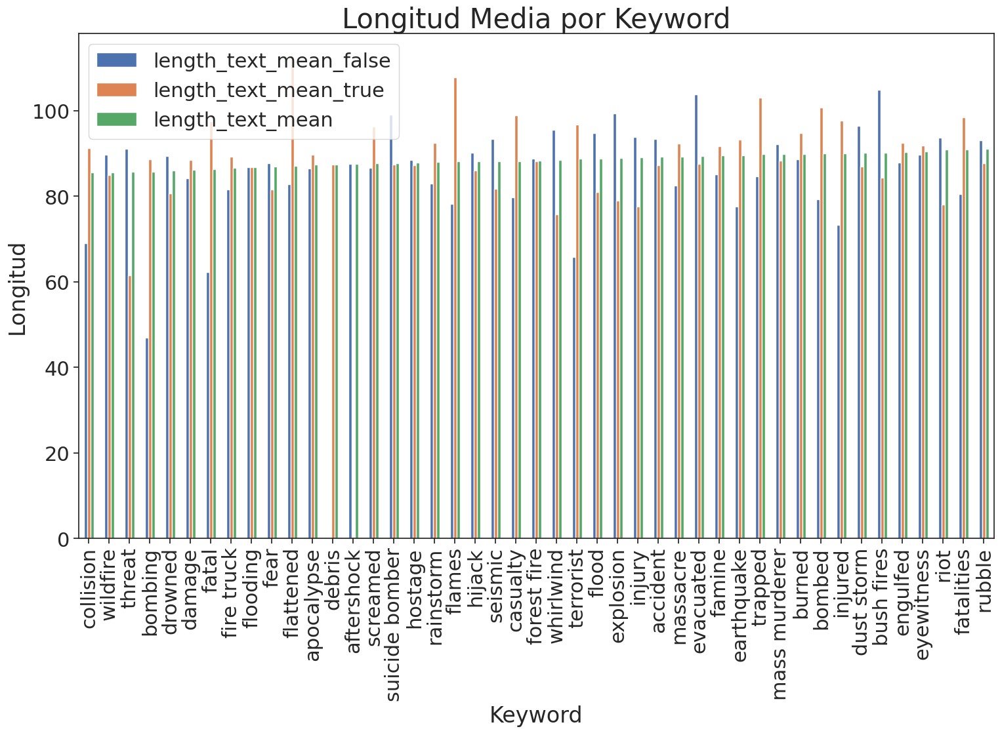

In [0]:
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[90:135, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0.5, 1.0, 'Longitud Media por Keyword')

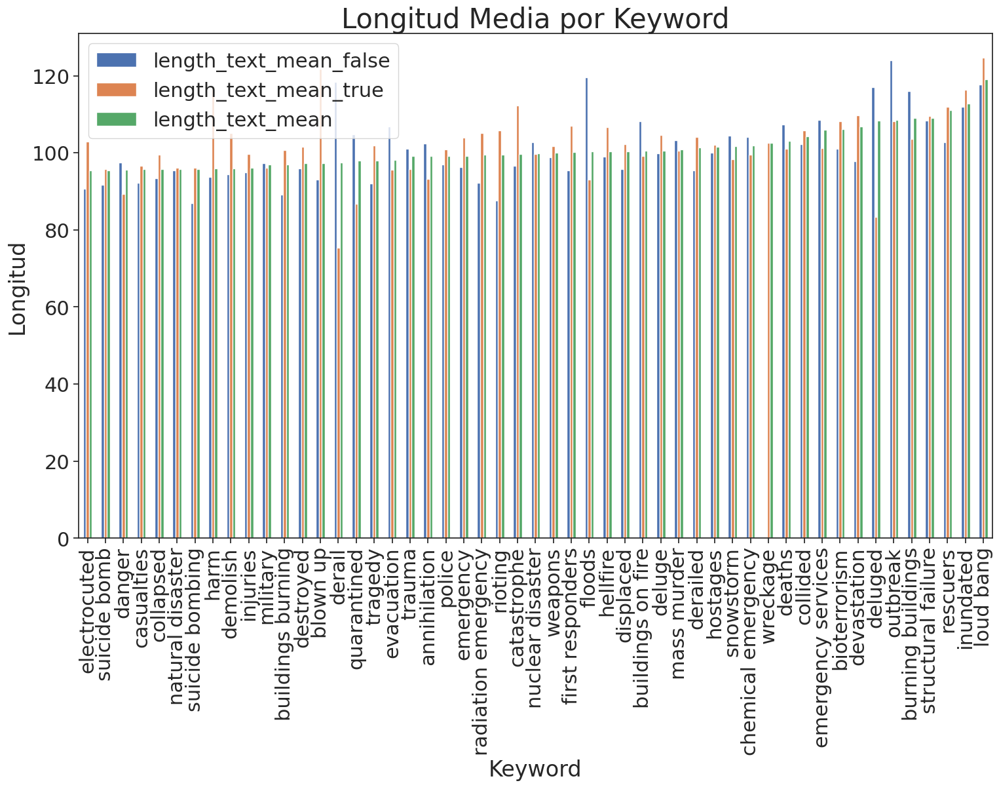

In [0]:
sns.set(style = 'ticks', font_scale = 2)
g = grouped_by_keyword_target_length_mean.sort_values('length_text_mean').iloc[170:, :].plot.bar(x = 'keyword', y = ['length_text_mean_false','length_text_mean_true', 'length_text_mean'], figsize=(18,10))
g.set_ylabel('Longitud', fontsize = 24)
g.set_xlabel('Keyword', fontsize = 24)
g.set_title('Longitud Media por Keyword', fontsize = 30)

Text(0, 0.5, '%/100')

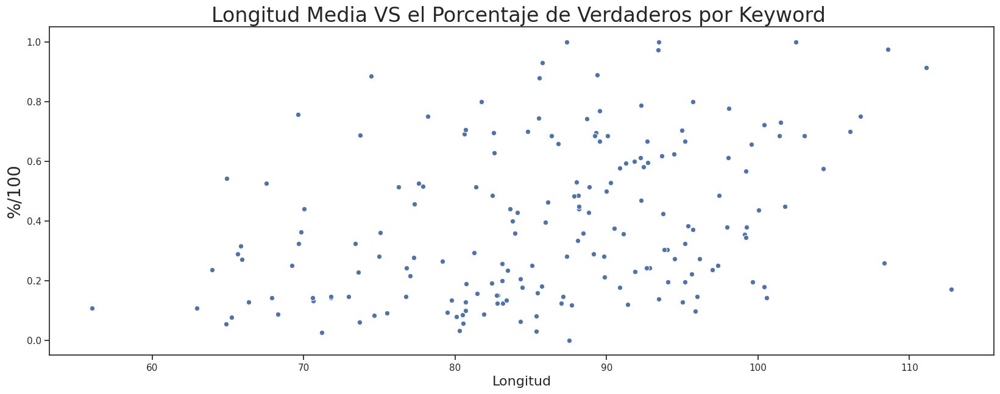

In [0]:
sns.set(style = 'ticks', font_scale = 1)
f, ax = plt.subplots(figsize = (20, 7))

sns.scatterplot(x = 'length_text_mean', y = 'target_coverage_true', data = grouped_by_keyword)

ax.set_title('Longitud Media VS el Porcentaje de Verdaderos por Keyword ', fontsize = 24)
ax.set_xlabel('Longitud', fontsize = 16)
ax.set_ylabel('%/100', fontsize = 20)

In [0]:
grouped_by_keyword['sqr(length_text_mean)'] = grouped_by_keyword.loc[:, 'length_text_mean'] * grouped_by_keyword.loc[:, 'length_text_mean']
grouped_by_keyword['length_text_mean^3'] = grouped_by_keyword.loc[:, 'sqr(length_text_mean)'] * grouped_by_keyword.loc[:, 'length_text_mean']
grouped_by_keyword.head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3
0,fatalities,90.89,29.79,45.00,0.58,26.00,"8,260.79","750,814.04"
1,deluge,100.57,30.46,42.00,0.14,6.00,"10,114.61","1,017,241.00"
2,armageddon,91.40,31.94,42.00,0.12,5.00,"8,354.83","763,671.29"
3,sinking,94.07,32.25,41.00,0.20,8.00,"8,849.76","832,525.12"
4,damage,86.15,35.19,41.00,0.46,19.00,"7,421.19","639,308.55"


Text(0, 0.5, 'Coverage True')

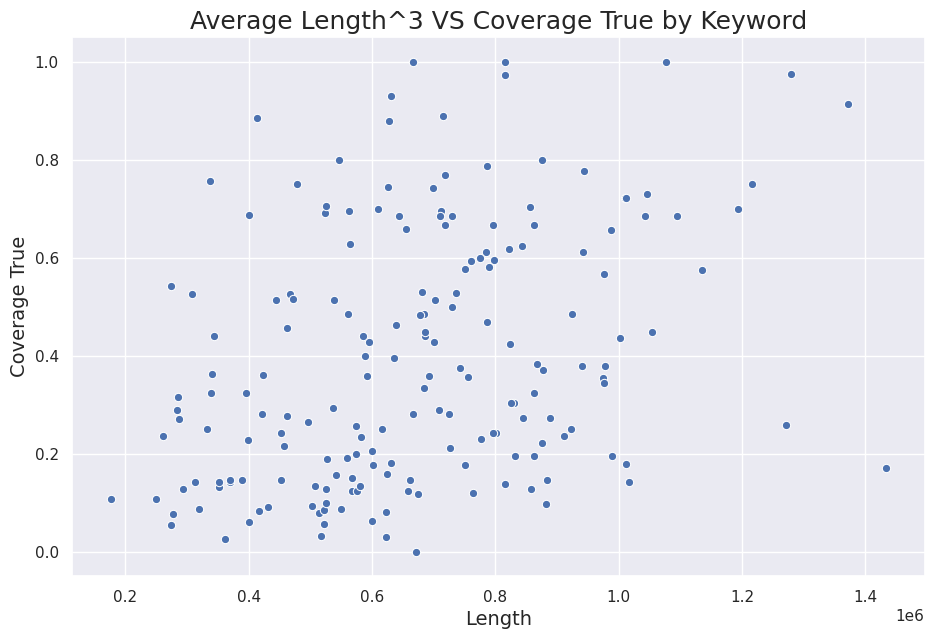

In [0]:
sns.set()
f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text_mean^3', y = 'target_coverage_true', data = grouped_by_keyword)

ax.set_title('Average Length^3 VS Coverage True by Keyword', fontsize = 18)
ax.set_xlabel('Length', fontsize = 14)
ax.set_ylabel('Coverage True', fontsize = 14)

In [0]:
def len_keyword (x):
  return len(x)

grouped_by_keyword['length_keyword'] = grouped_by_keyword.loc[:, 'keyword'].transform(len_keyword)
grouped_by_keyword.head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3,length_keyword
0,fatalities,90.89,29.79,45.00,0.58,26.00,"8,260.79","750,814.04",10
1,deluge,100.57,30.46,42.00,0.14,6.00,"10,114.61","1,017,241.00",6
2,armageddon,91.40,31.94,42.00,0.12,5.00,"8,354.83","763,671.29",10
3,sinking,94.07,32.25,41.00,0.20,8.00,"8,849.76","832,525.12",7
4,damage,86.15,35.19,41.00,0.46,19.00,"7,421.19","639,308.55",6


Text(0, 0.5, '%/100')

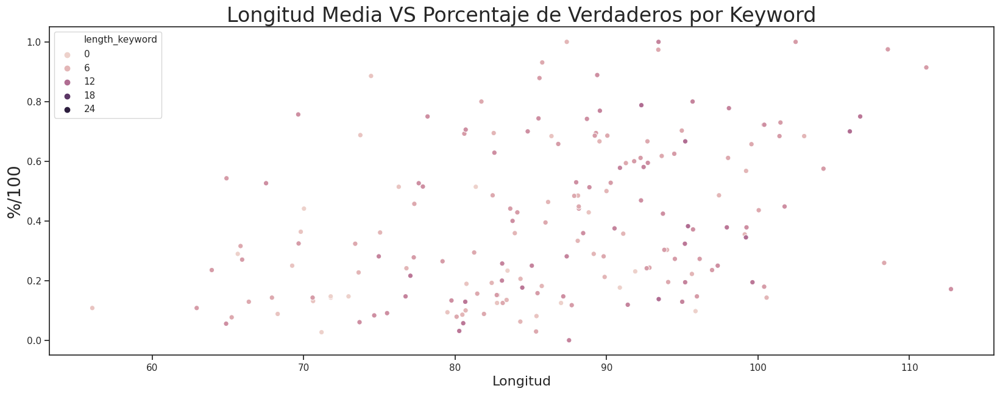

In [0]:
sns.set(style = 'ticks', font_scale = 1)
f, ax = plt.subplots(figsize = (20, 7))

sns.scatterplot(x = 'length_text_mean', y = 'target_coverage_true', hue = 'length_keyword', data = grouped_by_keyword)

ax.set_title('Longitud Media VS Porcentaje de Verdaderos por Keyword', fontsize = 24)
ax.set_xlabel('Longitud', fontsize = 16)
ax.set_ylabel('%/100', fontsize = 20)

In [0]:
grouped_by_keyword.loc[grouped_by_keyword.loc[:, 'length_keyword'] > 12, :].head()

,keyword,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3,length_keyword
61,burning buildings,108.97,26.76,37.00,nan,nan,"11,875.11","1,294,065.91",17
76,nuclear reactor,82.69,31.13,36.00,nan,nan,"6,838.37","565,495.30",15
84,airplane accident,93.09,30.20,35.00,nan,nan,"8,664.95","806,583.08",17
101,buildings burning,97.00,30.47,35.00,nan,nan,"9,409.00","912,673.00",17
102,bridge collapse,92.00,27.69,35.00,nan,nan,"8,464.00","778,688.00",15


Text(0, 0.5, '%/100')

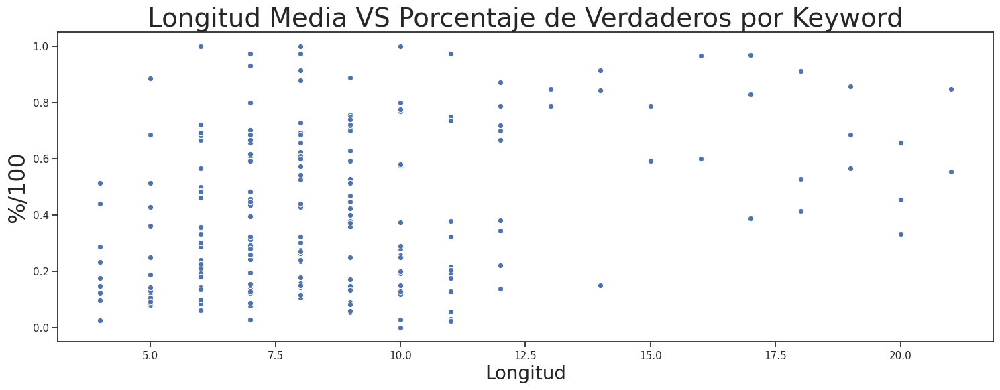

In [0]:
sns.set(style="ticks")

f, ax = plt.subplots(figsize = (18, 6))

sns.scatterplot(x = 'length_keyword', y = 'target_coverage_true', data = grouped_by_keyword)

ax.set_title('Longitud Media VS Porcentaje de Verdaderos por Keyword', fontsize = 28)
ax.set_xlabel('Longitud', fontsize = 20)
ax.set_ylabel('%/100', fontsize = 24)

In [0]:
train['quantity_words'] = train.loc[:, 'text'].transform(func = lambda x: len(x.split()))
train.head()

,id,keyword,location,text,target,length_text,length_text_mean_by_keyword,length_text_std_by_keyword,keyword_counts,target_categorico,quantity_words
3585,5162,fatalities,NaN,EXCLUSIVE: In 179 fatalities involving on-duty...,1,81,90.89,29.79,45,True,13
3586,5164,fatalities,New York,#NYC #News Legionnaires death toll rises to 8 ...,1,114,90.89,29.79,45,True,20
3587,5165,fatalities,"New York City ,NY",Let's fraction the vital need for Our fataliti...,0,101,90.89,29.79,45,False,17
3588,5166,fatalities,NaN,Las Vegas in top 5 cities for red-light runnin...,0,69,90.89,29.79,45,False,12
3589,5168,fatalities,"Corpus Christi, Texas",We are totally unprepared for an EMP attack. B...,1,135,90.89,29.79,45,True,23


Text(0, 0.5, 'Quantity Words')

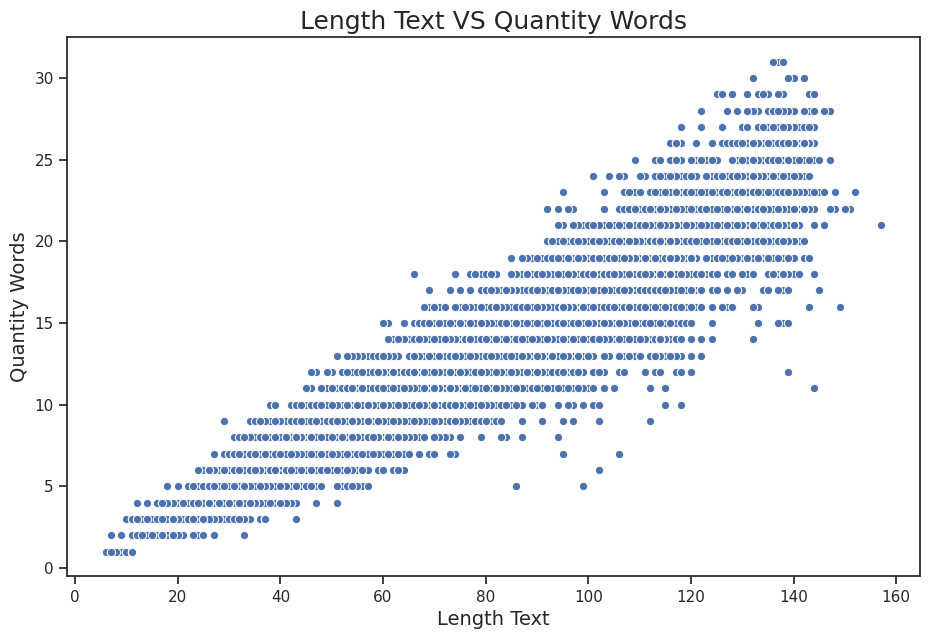

In [0]:
sns.set(style="ticks")

f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'length_text', y = 'quantity_words', data = train)

ax.set_title('Length Text VS Quantity Words', fontsize = 18)
ax.set_xlabel('Length Text', fontsize = 14)
ax.set_ylabel('Quantity Words', fontsize = 14)

Text(0, 0.5, 'Target')

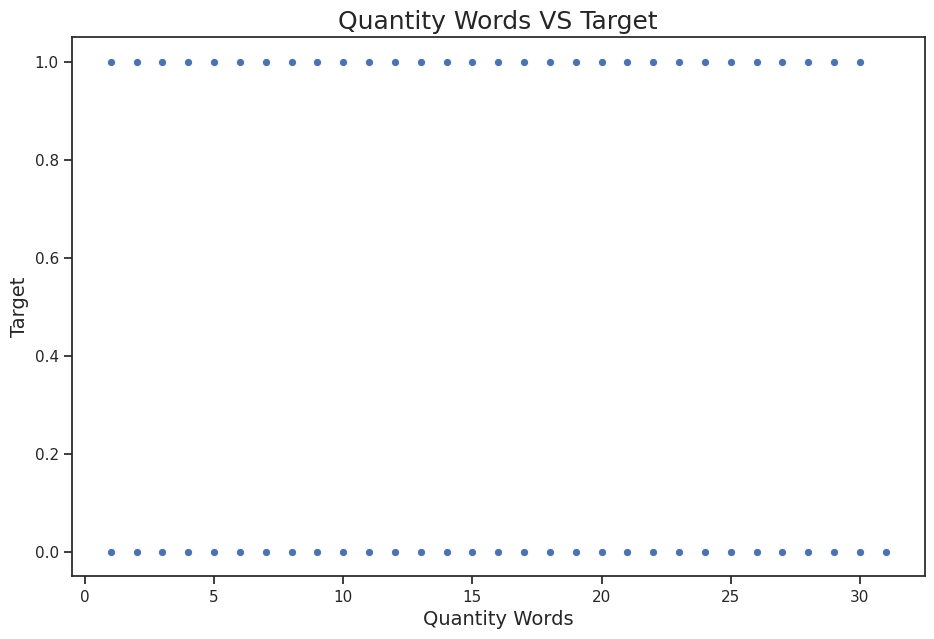

In [0]:
sns.set(style="ticks")

f, ax = plt.subplots(figsize = (11, 7))

sns.scatterplot(x = 'quantity_words', y = 'target', data = train)

ax.set_title('Quantity Words VS Target', fontsize = 18)
ax.set_xlabel('Quantity Words', fontsize = 14)
ax.set_ylabel('Target', fontsize = 14)

In [0]:
grouped_by_keyword.describe()

,length_text_mean,length_text_std,length_text_count,target_coverage_true,true_count,sqr(length_text_mean),length_text_mean^3,length_keyword
count,221.00,221.00,221.00,221.00,221.00,221.00,221.00,257.00
mean,87.49,30.69,34.17,0.42,14.61,"7,770.95","699,997.49",9.40
std,10.81,4.91,4.79,0.27,9.70,"1,876.15","249,795.10",3.81
min,56.05,15.99,9.00,0.00,0.00,"3,142.06","176,125.03",4.00
25%,80.76,27.98,33.00,0.18,6.00,"6,521.65","526,667.61",7.00
50%,88.17,31.07,35.00,0.38,13.00,"7,774.37","685,485.37",9.00
75%,94.97,34.22,37.00,0.67,22.00,"9,019.87","856,643.45",11.00
max,119.09,42.36,45.00,1.00,39.00,"14,182.01","1,688,910.28",21.00


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


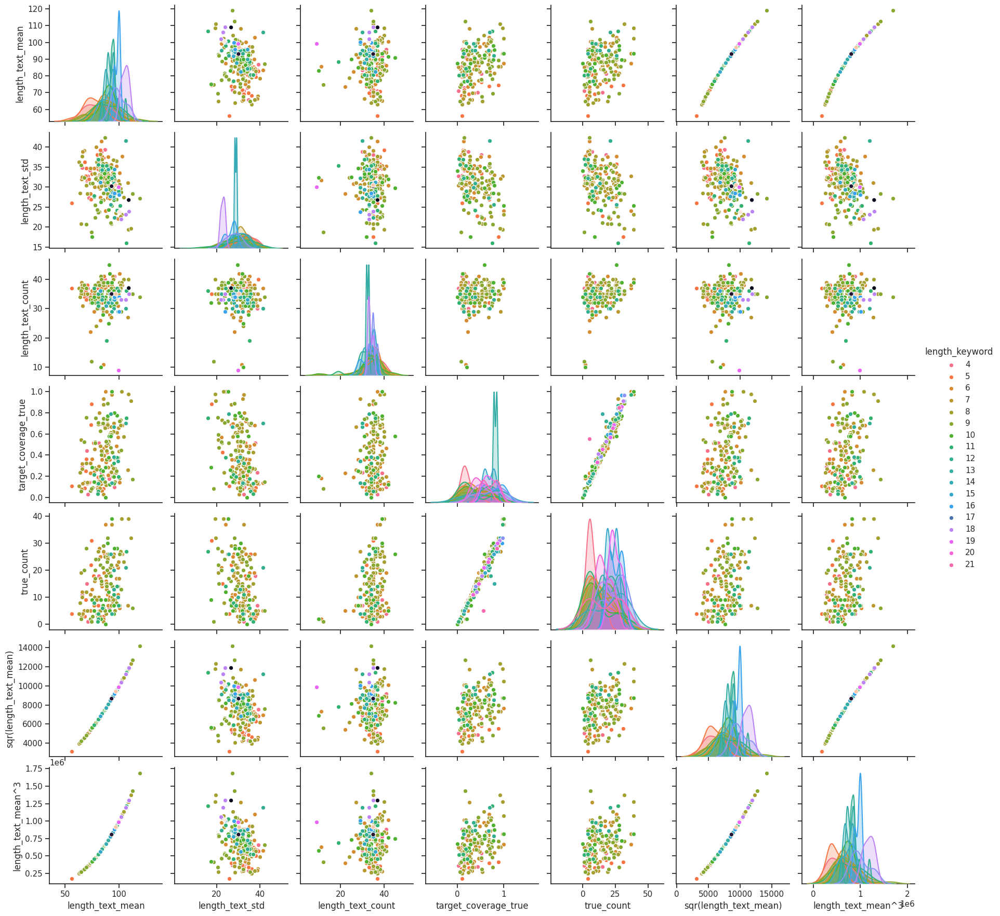

In [0]:
sns.set(style="ticks")
sns.pairplot(grouped_by_keyword, hue = 'length_keyword')

In [0]:
grouped_by_keyword_upper_length_mean = grouped_by_keyword.loc[grouped_by_keyword['length_text_count'] >\
                                                     grouped_by_keyword['length_text_count'].mean(),\
                                                     ['keyword', 'length_text_mean', 'length_text_count', 'target_coverage_true']]
grouped_by_keyword_upper_length_mean.head()

,keyword,length_text_mean,length_text_count,target_coverage_true
0,fatalities,90.89,45.00,0.58
1,deluge,100.57,42.00,0.14
2,armageddon,91.40,42.00,0.12
3,sinking,94.07,41.00,0.20
4,damage,86.15,41.00,0.46


In [0]:
train_keyword_fatalities = train.loc[train['keyword'] == 'fatalities', :]
train_keyword_fatalities.head()

,id,keyword,location,text,target,length_text,length_text_mean_by_keyword,length_text_std_by_keyword,keyword_counts,target_categorico,quantity_words
3585,5162,fatalities,NaN,EXCLUSIVE: In 179 fatalities involving on-duty...,1,81,90.89,29.79,45,True,13
3586,5164,fatalities,New York,#NYC #News Legionnaires death toll rises to 8 ...,1,114,90.89,29.79,45,True,20
3587,5165,fatalities,"New York City ,NY",Let's fraction the vital need for Our fataliti...,0,101,90.89,29.79,45,False,17
3588,5166,fatalities,NaN,Las Vegas in top 5 cities for red-light runnin...,0,69,90.89,29.79,45,False,12
3589,5168,fatalities,"Corpus Christi, Texas",We are totally unprepared for an EMP attack. B...,1,135,90.89,29.79,45,True,23


Text(0, 0.5, 'Target')

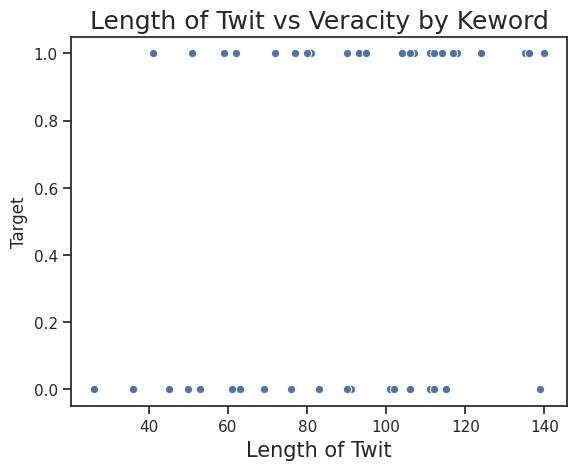

In [0]:
g = sns.scatterplot(x = 'length_text', y = 'target', data = train.loc[(train['keyword'] == 'fatalities'),:])
g.set_title('Length of Twit vs Veracity by Keword', fontsize = 18)
g.set_xlabel('Length of Twit', fontsize = 15)
g.set_ylabel('Target')

Text(0, 0.5, 'Target')

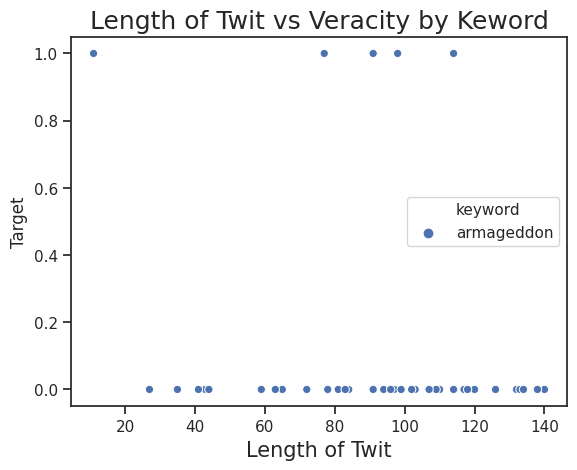

In [0]:
g = sns.scatterplot(x = 'length_text', y = 'target', data = train.loc[(train['keyword'] == 'armageddon'), :], hue = 'keyword')
g.set_title('Length of Twit vs Veracity by Keword', fontsize = 18)
g.set_xlabel('Length of Twit', fontsize = 15)
g.set_ylabel('Target')

Text(0, 0.5, 'Target')

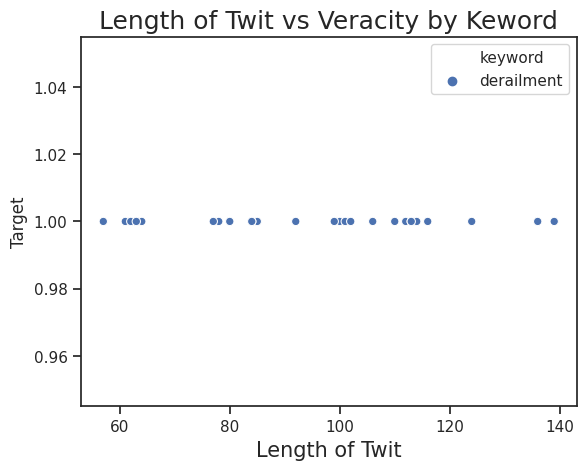

In [0]:
g = sns.scatterplot(x = 'length_text', y = 'target', data = train.loc[(train['keyword'] == 'derailment'), :], hue = 'keyword')
g.set_title('Length of Twit vs Veracity by Keword', fontsize = 18)
g.set_xlabel('Length of Twit', fontsize = 15)
g.set_ylabel('Target')